# 构建决策树替代模型

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt

# Load the merged CSV file
file_path = '../explainability_data/cleaned_state_actions.csv'
df = pd.read_csv(file_path)

# Separate the features (states) and target (actions)【细分状态和动作】
state_columns = [col for col in df.columns if col.startswith('State')]
action_columns = [col for col in df.columns if col.startswith('Action')]

X = df[state_columns]
y = df[action_columns]

# Split the data into training and testing sets【分离训练集80%和测试集20%，随机种子：随机划分，但是固定42下次划分也一样】【因为要重新训练一个模型来近似RL】
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



In [2]:
state_columns,action_columns

(['State_Cash_close_L1',
  'State_Cash_high_L1',
  'State_Cash_low_L1',
  'State_Cash_open_L1',
  'State_Cash_close_L2',
  'State_Cash_high_L2',
  'State_Cash_low_L2',
  'State_Cash_open_L2',
  'State_Cash_close_L3',
  'State_Cash_high_L3',
  'State_Cash_low_L3',
  'State_Cash_open_L3',
  'State_Cash_close_L4',
  'State_Cash_high_L4',
  'State_Cash_low_L4',
  'State_Cash_open_L4',
  'State_Cash_close_L5',
  'State_Cash_high_L5',
  'State_Cash_low_L5',
  'State_Cash_open_L5',
  'State_Cash_close_L6',
  'State_Cash_high_L6',
  'State_Cash_low_L6',
  'State_Cash_open_L6',
  'State_Cash_close_L7',
  'State_Cash_high_L7',
  'State_Cash_low_L7',
  'State_Cash_open_L7',
  'State_Cash_close_L8',
  'State_Cash_high_L8',
  'State_Cash_low_L8',
  'State_Cash_open_L8',
  'State_Cash_close_L9',
  'State_Cash_high_L9',
  'State_Cash_low_L9',
  'State_Cash_open_L9',
  'State_Cash_close_L10',
  'State_Cash_high_L10',
  'State_Cash_low_L10',
  'State_Cash_open_L10',
  'State_Cash_close_L11',
  'State_C

In [3]:

# Train the model
# RandomForestRegressor参数说明：
# n_estimators=100: 使用100棵决策树（可以理解为if-else的嵌套结构），平衡训练速度与模型性能
# random_state=42: 固定随机种子，确保结果可重现
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
# 开始训练
rf_model.fit(X_train, y_train)

# Improve the model【让机器帮我们找到用哪个替代模型近似得更好】
# Tune the hyperparameters of the Random Forest model
# 导入超参数调优和评估工具
from sklearn.model_selection import GridSearchCV  # 网格搜索交叉验证，用于自动寻找最优超参数
from sklearn.metrics import mean_squared_error    # 均方误差指标，用于评估模型预测精度

# Define the hyperparameters
# 定义超参数搜索网格
# param_grid参数说明：定义需要搜索的超参数组合范围
param_grid = {
    'n_estimators': [100, 500, 1000],      # 树的数量候选值：100,200,300棵
    'max_depth': [10, 20, 30],            # 树的最大深度候选值：控制模型复杂度
    'min_samples_split': [2, 5, 10],      # 内部节点分裂所需最小样本数：防止过拟合
    'min_samples_leaf': [1, 2, 4]         # 叶节点最少样本数：控制树生长的停止条件
}

# Instantiate the GridSearchCV object
# 实例化GridSearchCV对象进行超参数优化
# GridSearchCV参数说明：
# estimator=rf_model: 基础估计器为随机森林回归
# param_grid=param_grid: 使用上面定义的超参数搜索网格
# cv=3: 使用3折交叉验证，将训练集分成3份进行训练验证
# n_jobs=-1: 使用所有可用的CPU核心并行计算，加速搜索过程
# verbose=2: 显示详细的训练进度信息
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)

# 在训练集上执行网格搜索，寻找最优超参数组合
# fit方法会遍历所有81种超参数组合(3×3×3×3)，找到性能最好的配置
grid_search.fit(X_train, y_train)  # 执行网格搜索交叉验证过程

# Get the best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:")
print(best_params)

# Get the best model【最佳参数】
best_rf_model = grid_search.best_estimator_

# Evaluate the best model【最优替代模型】
y_pred_best_rf = best_rf_model.predict(X_test)
print("Best Random Forest Regression Report:")
print("MSE:", mean_squared_error(y_test, y_pred_best_rf))



Fitting 3 folds for each of 81 candidates, totalling 243 fits
Best Hyperparameters:
{'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 1000}
Best Random Forest Regression Report:
MSE: 5.79454259273804e-07


# SHAP

In [7]:
import shap
import numpy as np

# 简化调试版本
explainer = shap.TreeExplainer(best_rf_model)
shap_values = explainer.shap_values(X_test)

print("=== 调试信息 ===")
print(f"SHAP值类型: {type(shap_values)}")
if isinstance(shap_values, list):
    print(f"列表长度: {len(shap_values)}")
    for i, sv in enumerate(shap_values):
        print(f"  类别 {i} SHAP值形状: {sv.shape}")
else:
    print(f"SHAP值形状: {shap_values.shape}")

print(f"基准值: {explainer.expected_value}")
print(f"基准值类型: {type(explainer.expected_value)}")

# 确定正确的参数
sample_index = 1

if isinstance(shap_values, list):
    # 多分类
    shap_array = shap_values[1]  # 第二类
    base_value = explainer.expected_value[1]
else:
    # 单分类
    shap_array = shap_values
    base_value = explainer.expected_value

print(f"使用的基准值: {base_value}")
print(f"使用的SHAP数组形状: {shap_array.shape}")

# 最简单的调用
shap.initjs()
shap.force_plot(
    base_value,
    shap_array[sample_index],
    X_test.iloc[sample_index],
    feature_names=X_test.columns,
    matplotlib=False
)

=== 调试信息 ===
SHAP值类型: <class 'list'>
列表长度: 6
  类别 0 SHAP值形状: (95, 720)
  类别 1 SHAP值形状: (95, 720)
  类别 2 SHAP值形状: (95, 720)
  类别 3 SHAP值形状: (95, 720)
  类别 4 SHAP值形状: (95, 720)
  类别 5 SHAP值形状: (95, 720)
基准值: [0.16673854 0.1666375  0.16654067 0.16669548 0.16672489 0.16666293]
基准值类型: <class 'numpy.ndarray'>
使用的基准值: 0.1666374987512105
使用的SHAP数组形状: (95, 720)


# LIME

In [8]:
# 导入LIME库用于局部可解释性分析
import lime
import lime.lime_tabular

# 模块作用：为每个资产权重输出分别生成LIME解释，提供细粒度的决策透明度
# 论文对应：第4节中的多输出可解释性分析，分别理解各资产配置逻辑

# 获取目标变量列名（资产权重列）
action_columns = [col for col in df.columns if col.startswith('Action')]

# 获取特征变量列名（状态列）
state_columns = [col for col in df.columns if col.startswith('State')]

# 清理状态列名，移除'State_'前缀
# 例如：'State_AAPL_close' → 'AAPL_close'
state_columns = [col.replace('State_', '') for col in state_columns]

# 创建LIME表格数据解释器
# LimeTabularExplainer参数说明：
# training_data=X_train.values: 训练数据数值数组，用于理解特征分布
# mode='regression': 回归模式，因为预测连续资产权重
# feature_names=state_columns: 清理后的特征名称，用于可读性标签
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, mode='regression', feature_names=state_columns)

# 选择要解释的特定测试样本
sample_index = 60  # 选择测试集中第61个样本进行详细分析
instance = X_test.values[sample_index]  # 获取该样本的特征数值数组

# 遍历每个输出维度（6个资产权重）
for output_index in range(y_train.shape[1]):
    # 定义针对特定输出维度的预测函数
    # predict_fn函数参数说明：
    # x: 输入特征数据，形状为 [n_samples, n_features]
    # 返回：特定资产权重的预测值，形状为 [n_samples,]
    def predict_fn(x):
        return best_rf_model.predict(x)[:, output_index]

    # 为当前资产权重生成LIME解释
    # explain_instance参数说明：
    # instance: 要解释的特定样本特征值
    # predict_fn: 针对当前资产的专用预测函数
    # num_features=5: 显示最重要的5个特征
    exp = explainer.explain_instance(instance, predict_fn, num_features=5)

    # 输出当前资产的解释标题
    print(f"Explanation for output {action_columns[output_index]}:")

    # 在notebook中显示LIME解释结果
    # show_in_notebook参数说明：
    # show_table=True: 同时显示特征数值表格，提供更完整的信息
    exp.show_in_notebook(show_table=True)

Explanation for output Action_Cash:


Explanation for output Action_AAPL:


Explanation for output Action_ADBE:


Explanation for output Action_BABA:


Explanation for output Action_SNE:


Explanation for output Action_V:


# 特征重要性

In [17]:
import numpy as np

# Feature importance
# 从优化后的随机森林模型中提取特征重要性
# best_rf_model.feature_importances_:
#   返回每个特征的重要性分数，基于基尼不纯度减少或MSE减少
#   数值越大表示该特征在决策中越重要
importances = best_rf_model.feature_importances_

# 对特征重要性进行排序，获取从高到低的索引。[::-1]反转得到降序排列
indices = np.argsort(importances)[::-1]

# Columns names【特征列名】
columns = X_train.columns
# Delete words 'State_' from columns names【删掉STATE前缀】
columns = [col[6:] for col in columns]


# Plot the feature importances 
# plt.figure() # 创建新的图形窗口
# plt.size = (200, 400) # 设置图形尺寸。正确用法是plt.figure(figsize=(20, 40))

plt.figure(figsize=(200, 400))
plt.title("Feature importances")
# 绘制特征重要性条形图
# plt.bar参数说明：
# range(X_train.shape[1]): X轴位置，0到特征数量-1
# importances[indices]: 按重要性排序后的特征重要性值
# align="center": 条形图居中对齐
plt.bar(range(X_train.shape[1]), importances[indices], align="center")
# 设置X轴刻度标签
# plt.xticks参数说明：
# range(X_train.shape[1]): 刻度位置
# np.array(columns)[indices]: 按重要性排序后的特征名称
# rotation=90: 标签旋转90度，避免重叠提高可读性
plt.xticks(range(X_train.shape[1]), np.array(columns)[indices], rotation=90)
# 设置X轴范围，确保所有条形都可见
plt.xlim([-1, X_train.shape[1]])

# 显示图形
plt.show()


In [19]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

# # 方法1：直接保存为PDF
# plt.figure(figsize=(20, 40))
# plt.title("Feature Importances - Random Forest")
# plt.bar(range(X_train.shape[1]), importances[indices], align="center")
# plt.xticks(range(X_train.shape[1]), np.array(columns)[indices], rotation=90)
# plt.xlim([-1, X_train.shape[1]])
# plt.tight_layout()

# plt.savefig('feature_importances.pdf', bbox_inches='tight')
# print("✅ PDF已保存: feature_importances.pdf")

# 方法2：使用PdfPages保存多页（如果特征太多）
with PdfPages('feature_importances_detailed.pdf') as pdf:
    # 第一页：完整图
    plt.figure(figsize=(200, 400))
    plt.title("All Features Importance")
    plt.bar(range(X_train.shape[1]), importances[indices], align="center")
    plt.xticks(range(X_train.shape[1]), np.array(columns)[indices], rotation=90)
    plt.xlim([-1, X_train.shape[1]])
    plt.tight_layout()
    pdf.savefig()
    plt.close()
    
    # 第二页：只显示前30个重要特征
    plt.figure(figsize=(15, 10))
    plt.title("Top 30 Features Importance")
    top_n = min(30, len(indices))
    plt.bar(range(top_n), importances[indices][:top_n], align="center")
    plt.xticks(range(top_n), np.array(columns)[indices][:top_n], rotation=45)
    plt.tight_layout()
    pdf.savefig()
    plt.close()

print("✅ 多页PDF已保存: feature_importances_detailed.pdf")

✅ 多页PDF已保存: feature_importances_detailed.pdf


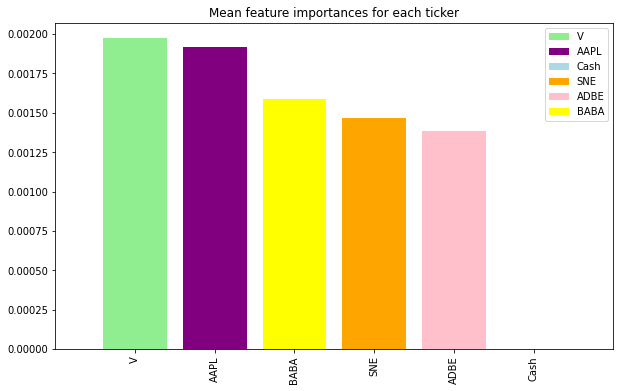

In [14]:
# 模块作用：计算并可视化各资产的平均特征重要性，识别在DRL决策中最重要的资产【按股票的 CHLO特征重要性 的平均值 排序】
# 论文对应：分析不同资产在整体投资决策中的相对重要性
# 从特征名称中提取资产代码
# col.split('_')[0]: 以第一个下划线分割，取前半部分作为资产代码
# 例如：'AAPL_close' → 'AAPL', 'V_high' → 'V'
tickers = [col.split('_')[0] for col in columns]

# 获取唯一的资产代码列表
# set(tickers): 去除重复的资产代码
# list(): 转换回列表格式
tickers = list(set(tickers))

# 创建颜色列表用于不同的资产代码
# 为每个资产分配独特的颜色，便于视觉区分
colors = ['lightgreen', 'purple', 'lightblue', 'orange', 'pink', 'yellow', 'red', 'blue', 'green', 'brown', 'black', 'grey', 'cyan', 'magenta', 'olive', 'navy', 'lime', 'teal', 'aqua', 'maroon', 'fuchsia', 'purple', 'silver', 'gray', 'white']

# 创建资产代码到颜色的映射字典
# dict(zip(tickers, colors)): 将资产代码列表和颜色列表配对创建字典
# 例如：{'AAPL': 'lightgreen', 'V': 'purple', ...}
ticker_colors = dict(zip(tickers, colors))

# 计算每个资产的平均特征重要性
mean_importances = []
for ticker in tickers:
    # 创建布尔掩码，选择属于当前资产的所有特征
    mask = [ticker in col for col in columns]

    # 计算当前资产所有特征重要性的平均值
    mean_importances.append(np.mean(importances[mask]))

# 对平均重要性进行排序（从高到低）
# np.argsort(mean_importances)[::-1]: 获取排序后的索引（降序）
indices = np.argsort(mean_importances)[::-1]

# 根据排序索引重新排列资产代码和平均重要性
tickers_sorted = np.array(tickers)[indices]
mean_importances_sorted = np.array(mean_importances)[indices]

# 模块作用：创建资产级别平均重要性的排序图表
# 论文对应：展示各资产在DRL决策中的整体影响力排名

# 创建图形窗口
plt.figure(figsize=(10, 6))
plt.title("Mean feature importances for each ticker")

# 绘制按平均重要性排序的条形图
# 使用资产对应的颜色编码
bars = plt.bar(range(len(tickers_sorted)), mean_importances_sorted, align="center",
               color=[ticker_colors[ticker] for ticker in tickers_sorted])


# 创建图例元素
# 导入matplotlib的Patch类用于创建图例标签
from matplotlib.patches import Patch

# 为每个资产代码创建图例元素
# Patch: 创建彩色方块作为图例标识
# facecolor: 方块颜色，对应资产代码的颜色
# label: 图例标签，显示资产代码
legend_elements_tickers = [Patch(facecolor=ticker_colors[ticker], label=ticker) for ticker in tickers]
# 添加资产图例
plt.legend(handles=legend_elements_tickers, loc='upper right')

# 设置X轴标签和范围
plt.xticks(range(len(tickers_sorted)), tickers_sorted, rotation=90)
plt.xlim([-1, len(tickers_sorted)])

# 显示图形
plt.show()

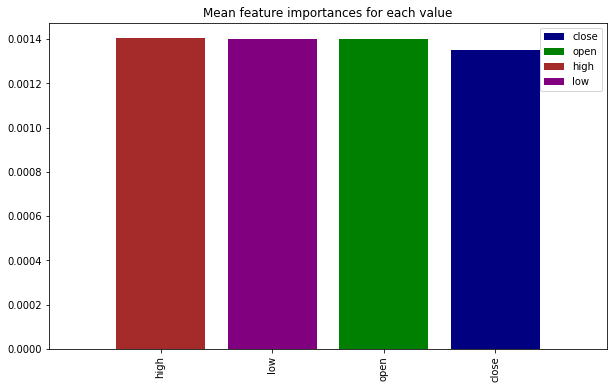

In [15]:
# 模块作用：计算并可视化各类价格指标的平均重要性，识别在DRL决策中最关键的价格信息类型【按照CHLO的 平均特征重要性 排序】
# 论文对应：分析不同价格指标在投资决策中的整体影响力
# 为不同的价格类型定义颜色
# 四种基本价格指标的颜色分配：
# 'navy': 收盘价 - 深蓝色，通常是最重要的价格
# 'green': 开盘价 - 绿色，代表起始价格
# 'brown': 最高价 - 棕色，代表价格上限
# 'purple': 最低价 - 紫色，代表价格下限
colors = ['navy', 'green', 'brown', 'purple']

# 创建价格类型到颜色的映射字典
# dict(zip(['close', 'open', 'high', 'low'], colors)):
#   将价格类型列表和颜色列表配对创建字典
#   映射关系：{'close': 'navy', 'open': 'green', 'high': 'brown', 'low': 'purple'}
value_colors = dict(zip(['close', 'open', 'high', 'low'], colors))
# 计算每个价格类型的平均特征重要性
mean_importances = []
for value in ['close', 'open', 'high', 'low']:
    # 创建布尔掩码，选择包含当前价格类型的所有特征
    mask = [value in col for col in columns]

    # 计算当前价格类型所有特征重要性的平均值
    mean_importances.append(np.mean(importances[mask]))

# 对平均重要性进行排序（从高到低）
# np.argsort(mean_importances)[::-1]: 获取排序后的索引（降序）
indices = np.argsort(mean_importances)[::-1]

# 价格类型列表
values_sorted = ['close', 'open', 'high', 'low']
# 根据排序索引重新排列价格类型和平均重要性
values_sorted = np.array(values_sorted)[indices]
mean_importances_sorted = np.array(mean_importances)[indices]

# 模块作用：创建价格类型级别平均重要性的排序图表
# 论文对应：展示各类价格信息在DRL决策中的整体影响力排名

# 创建图形窗口
plt.figure(figsize=(10, 6))
plt.title("Mean feature importances for each value")

# 绘制按平均重要性排序的条形图
# 使用价格类型对应的颜色编码
bars = plt.bar(range(len(values_sorted)), mean_importances_sorted, align="center",
               color=[value_colors[value] for value in values_sorted])

# 创建价格类型图例元素
from matplotlib.patches import Patch

# 为每种价格类型创建图例元素
# Patch: 创建彩色方块作为图例标识
# facecolor: 方块颜色，对应价格类型的颜色
# label: 图例标签，显示价格类型名称
legend_elements_values = [Patch(facecolor=value_colors[value], label=value) for value in ['close', 'open', 'high', 'low']]

# 添加价格类型图例
plt.legend(handles=legend_elements_values, loc='upper right')

# 设置X轴标签和范围
plt.xticks(range(len(values_sorted)), values_sorted, rotation=90)
plt.xlim([-1, len(values_sorted)])

# 显示图形
plt.show()